Library Imports

In [15]:
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os
from cv2 import dnn_superres
from moviepy.editor import *
from moviepy.audio.fx.all import audio_fadeout, audio_fadein
from PIL import ImageDraw, ImageFilter, Image, ImageEnhance, ImageColor, ImageOps
from IPython.display import Video
from rembg import remove
from tqdm import tqdm

General Functions

In [5]:
# Opens and converts an image file at path to specified mode
def open_image(path, mode="RGBA"):
    return Image.open(path).convert(mode)

# Scales the inputimage by scale_factor
def scale_image(image, scale_factor):
    width, height = image.size
    new_width = int(width * scale_factor)
    new_height = int(height * scale_factor)
    return image.resize((new_width, new_height))

# Removes background from the input image
def remove_background(image):
    new_image = remove(image)
    return new_image

# Adjusts brightness of the input image by the specified factor
def adjust_brightness(image, factor):
    enhancer = ImageEnhance.Brightness(image)
    return enhancer.enhance(factor)

# Adjust the opacity of the input image by the specified factor
def crop_and_adjust_opacity(image, opacity_factor):
    # Crop to visible content
    alpha = image.split()[-1]
    bbox = alpha.getbbox()
    cropped = image.crop(bbox)
    
    # Adjust opacity
    pixels = cropped.load()
    width, height = cropped.size
    for x in range(width):
        for y in range(height):
            r, g, b, a = pixels[x, y]
            pixels[x, y] = (r, g, b, int(a * opacity_factor))
    
    return cropped

# Adjusts blur of the input image by the specified radius
def blur_image(image, radius=2):
    return image.filter(ImageFilter.GaussianBlur(radius))

# Pastes the overlay image onto the background image with rotation
def paste_with_rotation(background, overlay, x_factor, y_factor, rotation_degrees):
    rotated_overlay = overlay.rotate(rotation_degrees, expand=True)
    bg_width, bg_height = background.size
    offset_x = int(bg_width * x_factor)
    offset_y = int(bg_height * y_factor)
    paste_x = offset_x - rotated_overlay.width // 2
    paste_y = offset_y - rotated_overlay.height // 2
    background.paste(rotated_overlay, (paste_x, paste_y), rotated_overlay)

# Creates a shadow effect for the input image
def create_shadow(image, blur_radius=10, opacity=0.5, squash_factor=0.5, squash_axis="y"):
    shadow = Image.new("RGBA", image.size, (0, 0, 0, 0))
    for x in range(image.width):
        for y in range(image.height):
            _, _, _, a = image.getpixel((x, y))
            if a > 0:
                shadow.putpixel((x, y), (0, 0, 0, int(255 * opacity)))

    shadow = shadow.filter(ImageFilter.GaussianBlur(radius=blur_radius))

    if squash_axis.lower() == "x":
        new_width = int(shadow.width * squash_factor)
        shadow = shadow.resize((new_width, shadow.height), Image.LANCZOS)
    elif squash_axis.lower() == "y":
        new_height = int(shadow.height * squash_factor)
        shadow = shadow.resize((shadow.width, new_height), Image.LANCZOS)
    else:
        raise ValueError("squash_axis must be either x or y")

    return shadow

# Adds a vignette effect to the input image with the specified strength
def add_vignette(image, strength=0.75):
    width, height = image.size
    mask = Image.new("L", (width, height))
    draw = ImageDraw.Draw(mask)
    
    for y in range(height):
        for x in range(width):
            distance = min(1.0, ((x - width/2.0)**2 + (y - height/2.0)**2) / ((width/2.0)**2 + (height/2.0)**2))
            darkness = int(255 * (1 - distance * strength))
            draw.point((x, y), fill=darkness)
    
    return Image.composite(image, Image.new("RGB", (width, height), "black"), mask)

def create_pisa_animation(image, fps, num_frames, min_factor=0.85, max_factor=1.2, amplitude=6.5, frequency=144, shake_start=0.25, shake_end=0.75, shake_amplitude=5):
    image.thumbnail((3264, 2448), Image.LANCZOS)
    width, height = image.size
    pixels = image.load()
    frames = []

    for i in tqdm(range(num_frames), desc="Creating animation frames", unit="frame"):
        new_image = Image.new("RGBA", (3264, 2448), (0, 0, 0, 0))
        new_pixels = new_image.load()
        phase_shift = i / num_frames
        
        # Apply shaking effect if within the specified time range
        shake_offset_x = 0
        shake_offset_y = 0
        if shake_start <= phase_shift < shake_end:
            shake_offset_x = int(shake_amplitude * (np.random.random() - 0.5) * 2)  # Random shake in x direction
            shake_offset_y = int(shake_amplitude * (np.random.random() - 0.5) * 2)  # Random shake in y direction

        for x in range(width):
            for y in range(height):
                offset = int(amplitude * np.sin(2 * np.pi * (x / frequency + phase_shift)))
                new_x = x + shake_offset_x
                new_y = y + offset + shake_offset_y
                if 0 <= new_x < width and 0 <= new_y < height:
                    new_pixels[new_x, new_y] = pixels[x, y]

        factor = min_factor + (max_factor - min_factor) * abs(np.sin(2 * np.pi * i / num_frames))
        enhancer = ImageEnhance.Brightness(new_image)
        bright_wave_frame = enhancer.enhance(factor)

        zoom_factor = 1.1
        zoomed_width = int(width * zoom_factor)
        zoomed_height = int(height * zoom_factor)
        zoomed_bright_wave_frame = bright_wave_frame.resize((zoomed_width, zoomed_height), Image.LANCZOS)

        canvas = Image.new("RGBA", (3264, 2448), (0, 0, 0, 0))
        canvas.paste(zoomed_bright_wave_frame, ((3264 - zoomed_width) // 2, (2448 - zoomed_height) // 2))

        frames.append(canvas)

    return frames

def images_to_video(image_folder, video_file, fps=24):
    images = [img for img in sorted(os.listdir(image_folder)) if img.endswith(".png")]

    if not images:
        raise ValueError("No PNG images found in the directory.")

    first_frame = cv2.imread(os.path.join(image_folder, images[0]))
    if first_frame is None:
        raise ValueError(f"Unable to read the image file {images[0]}")
    height, width, layers = first_frame.shape

    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    video = cv2.VideoWriter(video_file, fourcc, fps, (width, height))

    for image in tqdm(images, desc="Creating video", unit = "frame"):
        frame = cv2.imread(os.path.join(image_folder, image))
        if frame is None:
            print(f"Warning: Unable to read the image file {image}. Skipping...")
            continue
        if frame.shape[0] != height or frame.shape[1] != width:
            print(f"Warning: The image file {image} has different dimensions. Resizing...")
            frame = cv2.resize(frame, (width, height))
        video.write(frame)

    video.release()
    print(f"Video saved as {video_file}")

def add_audio_to_video(video_path, audio_path, output_path, fade_duration=3, audio_start_frac=0, audio_end_frac=1):
    video = VideoFileClip(video_path)
    background_music = AudioFileClip(audio_path)

    audio_start = video.duration * audio_start_frac
    audio_end = video.duration * audio_end_frac

    if audio_end > video.duration:
        audio_end = video.duration
    
    audio_duration = audio_end - audio_start
    background_music = background_music.subclip(0, min(audio_duration, background_music.duration))

    background_music = audio_fadein(background_music, duration=fade_duration)
    background_music = audio_fadeout(background_music, duration=fade_duration)
    background_music = background_music.volumex(0.8)

    if video.audio is None:
        final_audio = background_music.set_start(audio_start)
    else:
        background_music = background_music.set_start(audio_start)
        final_audio = CompositeAudioClip([video.audio, background_music])

    final_video = video.set_audio(final_audio)
    final_video.write_videofile(output_path, codec="libx264", audio_codec="aac")

    video.close()
    background_music.close()
    final_video.close()
    
def apply_sobel(image):
    rgba_channels = cv2.split(image)
    rgb_image = cv2.merge(rgba_channels[:3])
    alpha_channel = rgba_channels[3]

    rgb_gray = cv2.cvtColor(rgb_image, cv2.COLOR_RGB2GRAY)

    sobel_x = cv2.Sobel(rgb_gray, cv2.CV_64F, 1, 0, ksize=1)
    sobel_y = cv2.Sobel(rgb_gray, cv2.CV_64F, 0, 1, ksize=1)
    sobel_magnitude = cv2.magnitude(sobel_x, sobel_y)
    sobel_magnitude = cv2.convertScaleAbs(sobel_magnitude)

    sobel_rgba = cv2.merge([sobel_magnitude, sobel_magnitude, sobel_magnitude, alpha_channel])

    return sobel_rgba

def apply_perspective_transform(image, top_shrink=0.5, bottom_expand=1.2):
    original_points = np.float32([[0, 0], [image.shape[1], 0],
                                  [image.shape[1], image.shape[0]],
                                  [0, image.shape[0]]])

    desired_points = np.float32([[int(image.shape[1] * (1 - top_shrink) / 2), int(image.shape[0] * top_shrink)],
                                 [int(image.shape[1] * (1 + top_shrink) / 2), int(image.shape[0] * top_shrink)],
                                 [int(image.shape[1] * (1 + bottom_expand) / 2), int(image.shape[0] * bottom_expand)],
                                 [int(image.shape[1] * (1 - bottom_expand) / 2), int(image.shape[0] * bottom_expand)]])

    perspective_matrix = cv2.getPerspectiveTransform(original_points, desired_points)

    warped_image = cv2.warpPerspective(image, perspective_matrix, (image.shape[1], image.shape[0]))

    return warped_image

def apply_color_tint(image_np, threshold, custom_color_hex, tint_strength):
    white_mask = (image_np[:,:,0] > threshold) & \
                 (image_np[:,:,1] > threshold) & \
                 (image_np[:,:,2] > threshold)

    custom_color_rgb = np.array(ImageColor.getcolor(custom_color_hex, "RGB"))
    
    image_np[white_mask, :3] = image_np[white_mask, :3] * (1 - tint_strength) + custom_color_rgb * tint_strength

    tinted_image = Image.fromarray(image_np.astype(np.uint8))
    return tinted_image

def bob_video(input_path, output_path, overlay_path, output_width, output_height, zoom_factor, bob_amplitude, bob_frequency):
    overlayed_video = VideoFileClip(input_path)

    scale_factor = max(output_width / overlayed_video.w, output_height / overlayed_video.h)
    resized_video = overlayed_video.resize(scale_factor)

    background = ColorClip(size=(output_width, output_height), color=(0,0,0)).set_duration(overlayed_video.duration)

    video_pos = ((output_width - resized_video.w) // 2, (output_height - resized_video.h) // 2)

    zoomed_bobbing_video = resized_video.fl(
        lambda get_frame, t: cv2.warpAffine(
            get_frame(t),
            np.float32([
                [zoom_factor, 0, -zoom_factor * get_frame(t).shape[1] * 0.5 + get_frame(t).shape[1] * 0.5],
                [0, zoom_factor, -zoom_factor * get_frame(t).shape[0] * 0.5 + get_frame(t).shape[0] * 0.5 + 
                 bob_amplitude * np.sin(2 * np.pi * bob_frequency * t)]
            ]),
            (get_frame(t).shape[1], get_frame(t).shape[0])
        )
    ).set_position(video_pos)

    composed_video = CompositeVideoClip([background, zoomed_bobbing_video])

    shipdeck = Image.open(overlay_path)
    resized_shipdeck = shipdeck.resize((output_width, output_height), Image.LANCZOS)
    shipdeck_array = np.array(resized_shipdeck)

    shipdeck_clip = ImageClip(shipdeck_array).set_duration(overlayed_video.duration)

    final_clip = CompositeVideoClip([composed_video, shipdeck_clip])

    final_clip.write_videofile(output_path)

def adjust_video_color_balance(frame, red_factor, green_factor, blue_factor):
    frame = frame.astype(np.float32)
    frame[:, :, 0] *= red_factor
    frame[:, :, 1] *= green_factor
    frame[:, :, 2] *= blue_factor
    frame = np.clip(frame, 0, 255).astype(np.uint8)
    return frame

Shipdeck Scene

In [6]:
blank_background = Image.new('RGBA', (3264, 2448), (0, 0, 0, 0))
blank_background.save("../Processed Pic/Shipdeck/blank_background.png", "PNG")

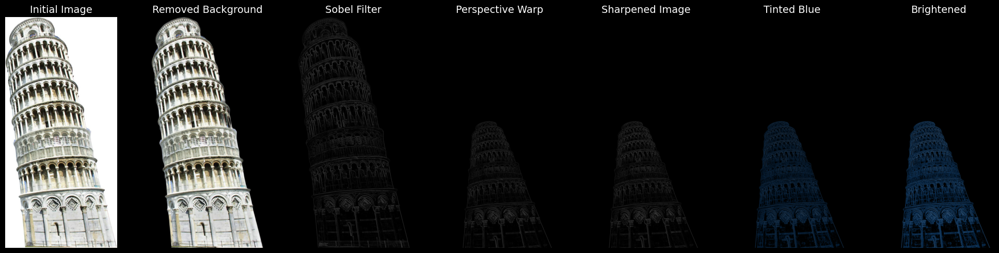

In [7]:
pisa_2 = open_image("../Pic/pisa_cutout_2.jpg")
pisa_2_resized = scale_image(pisa_2, 2.2)
pisa_2_transparent = remove_background(pisa_2_resized)
pisa_2_blurred = blur_image(pisa_2_transparent, radius=1.2)

pisa_2_blurred_np = np.array(pisa_2_blurred)

sobel_pisa_2_rgba = apply_sobel(pisa_2_blurred_np)
sobel_pisa_2_pil = Image.fromarray(sobel_pisa_2_rgba)

warped_pisa_2 = apply_perspective_transform(sobel_pisa_2_rgba, top_shrink=0.45, bottom_expand=1.1)
warped_pisa_2_pil = Image.fromarray(warped_pisa_2)

sharpness_enhancer = ImageEnhance.Sharpness(warped_pisa_2_pil)
sharpened_pisa_2 = sharpness_enhancer.enhance(4)

sharpened_pisa_2_np = np.array(sharpened_pisa_2)
tinted_pisa_2 = apply_color_tint(sharpened_pisa_2_np, 5, "#003366", 0.5)

brightned_pisa_2 = adjust_brightness(tinted_pisa_2, 1.5)

images = [pisa_2, pisa_2_transparent, sobel_pisa_2_pil, warped_pisa_2_pil, sharpened_pisa_2, tinted_pisa_2, brightned_pisa_2]
captions = ["Initial Image", "Removed Background", "Sobel Filter", "Perspective Warp", "Sharpened Image", "Tinted Blue", "Brightened"]

fig, axes = plt.subplots(1, len(images), figsize=(20, 5), facecolor="black")

for ax, img, caption in zip(axes, images, captions):
    ax.imshow(img)
    ax.set_title(caption, fontsize=14, color="white")
    ax.axis("off")

plt.tight_layout()
plt.show()

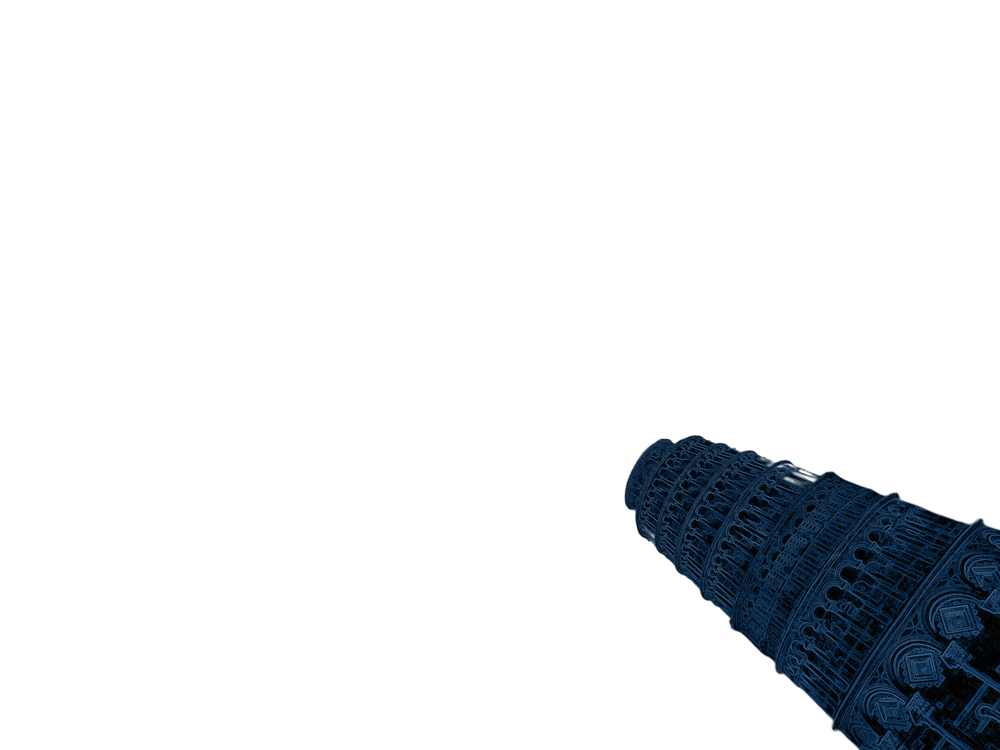

In [8]:
paste_with_rotation(blank_background, brightned_pisa_2, 0.7, 0.6, 50)
blank_background.save("../Processed Pic/Shipdeck/pisa_2_blue_underwater.png")
blank_background

In [9]:
video = VideoFileClip("../Pic/sea.mp4")
image = ImageClip("../Processed Pic/Shipdeck/pisa_2_blue_underwater.png")

video_with_opacity = video.set_opacity(0.5)

brightness_factor = 0.25
brightness_factor = 0.25
brightened_video = video_with_opacity.fl_image(lambda frame: np.clip(frame * (1 + brightness_factor), 0, 255).astype(np.uint8))

adjusted_video = brightened_video.fl_image(lambda frame: adjust_video_color_balance(frame, red_factor=0.9, green_factor=0.8, blue_factor=0.7))

final_video = CompositeVideoClip([image, adjusted_video])
final_video = final_video.set_duration(video.duration)
final_video.write_videofile("../Processed Pic/Shipdeck/sea_overlayed.mp4", codec="libx264")

video.close()
final_video.close()

Moviepy - Building video ../Processed Pic/Shipdeck/sea_overlayed.mp4.
MoviePy - Writing audio in sea_overlayedTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ../Processed Pic/Shipdeck/sea_overlayed.mp4



Moviepy - Done !
Moviepy - video ready ../Processed Pic/Shipdeck/sea_overlayed.mp4


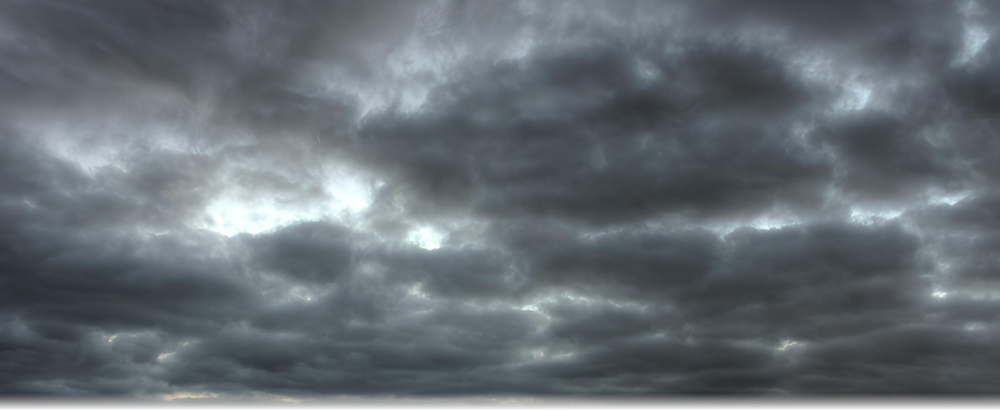

In [10]:
sky = Image.open("../Pic/sky.jpg")
width, height = sky.size

side_crop = int(width * 0.12)
sky_cropped = sky.crop((side_crop, 0, width - side_crop, height // 2))

width, height = sky_cropped.size
feather_height = 50

mask = Image.new('L', (width, height), 255)
draw = ImageDraw.Draw(mask)

for y in range(feather_height):
    opacity = int(255 * (1 - y / feather_height))
    draw.line([(0, height - feather_height + y), (width, height - feather_height + y)], fill=opacity)

sky_cropped = sky_cropped.convert('RGBA')
feathered_sky = Image.composite(sky_cropped, Image.new('RGBA', sky_cropped.size), mask)

feathered_sky.save("../Processed Pic/Shipdeck/sky_cropped_feathered.png", format="PNG")

feathered_sky

In [11]:
video = VideoFileClip("../Processed Pic/Shipdeck/sea_overlayed.mp4")
image = ImageClip("../Processed Pic/Shipdeck/sky_cropped_feathered.png")

video_width, video_height = video.w, video.h
image_width, image_height = image.size

scale_factor = video_width / image_width
new_height = int(image_height * scale_factor)
image_resized = image.resize(newsize=(video_width, new_height))

y_position = 0

image_resized = image_resized.set_position((0, y_position))
image_resized = image_resized.set_duration(video.duration)

# Create the composite video
final_video = CompositeVideoClip([video, image_resized])

final_video.write_videofile("../Processed Pic/Shipdeck/sky_overlayed.mp4")

Moviepy - Building video ../Processed Pic/Shipdeck/sky_overlayed.mp4.
MoviePy - Writing audio in sky_overlayedTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ../Processed Pic/Shipdeck/sky_overlayed.mp4



Moviepy - Done !
Moviepy - video ready ../Processed Pic/Shipdeck/sky_overlayed.mp4


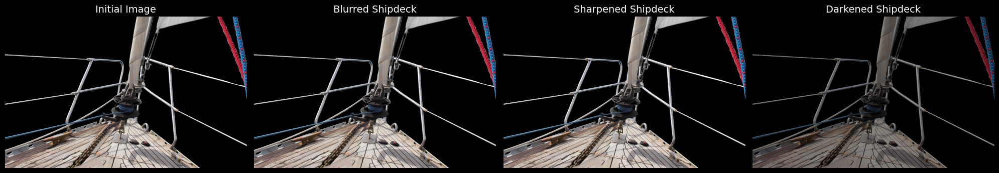

In [12]:
shipdeck = open_image("../Pic/shipdeck.png")
shipdeck_blurred = blur_image(shipdeck, radius=0.7)
sharpness_enhancer = ImageEnhance.Sharpness(shipdeck_blurred)
shipdeck_sharpened = sharpness_enhancer.enhance(6.5)
shipdeck_darkened = adjust_brightness(shipdeck_sharpened, 0.6)
shipdeck_darkened.save("../Processed Pic/Shipdeck/shipdeck_processed.png")

images = [shipdeck, shipdeck_blurred, shipdeck_sharpened, shipdeck_darkened]
captions = ["Initial Image", "Blurred Shipdeck", "Sharpened Shipdeck", "Darkened Shipdeck"]

fig, axes = plt.subplots(1, len(images), figsize=(20, 5), facecolor="black")

for ax, img, caption in zip(axes, images, captions):
    ax.imshow(img)
    ax.set_title(caption, fontsize=14, color="white")
    ax.axis("off")

plt.tight_layout()
plt.show()

In [13]:
bob_video(
    input_path="../Processed Pic/Shipdeck/sky_overlayed.mp4",
    output_path="../Processed Pic/Shipdeck/shipdeck.mp4",
    overlay_path="../Processed Pic/Shipdeck/shipdeck_processed.png",
    output_width=3264,
    output_height=2448,
    zoom_factor=1.1,
    bob_amplitude=50,
    bob_frequency=0.35
)

Moviepy - Building video ../Processed Pic/Shipdeck/shipdeck.mp4.
MoviePy - Writing audio in shipdeckTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ../Processed Pic/Shipdeck/shipdeck.mp4



Moviepy - Done !
Moviepy - video ready ../Processed Pic/Shipdeck/shipdeck.mp4


In [14]:
video = VideoFileClip("../Processed Pic/Shipdeck/shipdeck.mp4")

width, height = video.size
X, Y = np.ogrid[:height, :width]
center_x, center_y = width / 2, height / 2
radius = max(width, height) / 2
gradation = 2.5

distance_from_center = np.sqrt((X - center_y) ** 2 + (Y - center_x) ** 2)

vignette_mask = 1 - np.clip((distance_from_center / radius) ** gradation, 0, 1)

alpha = 0.5
vignette_video = video.fl(lambda gf, t: (alpha * gf(t) + (1 - alpha) * gf(t) * vignette_mask[..., np.newaxis]).astype('uint8'))
vignette_video.write_videofile("../Processed Pic/Shipdeck/shipdeck_vignette.mp4", codec="libx264")

video.close()
vignette_video.close()

Moviepy - Building video ../Processed Pic/Shipdeck/shipdeck_vignette.mp4.
MoviePy - Writing audio in shipdeck_vignetteTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video ../Processed Pic/Shipdeck/shipdeck_vignette.mp4



Moviepy - Done !
Moviepy - video ready ../Processed Pic/Shipdeck/shipdeck_vignette.mp4


Underwater Tower of Pisa Scene

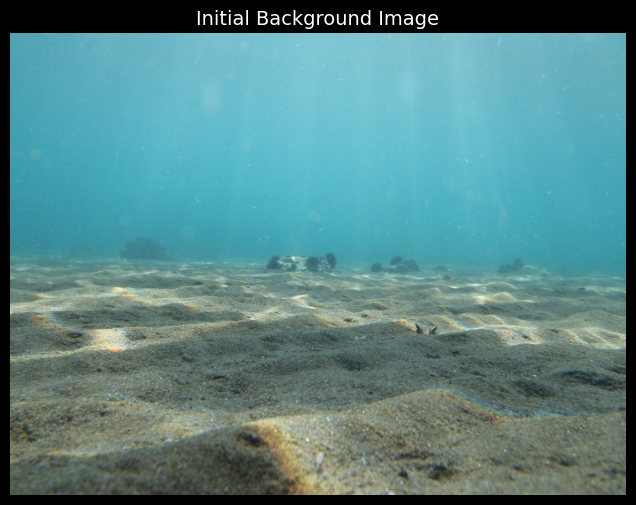

In [12]:
background = open_image("../Pic/background.jpg")

plt.figure(figsize=(8, 6), facecolor="black")
plt.imshow(background)
plt.title("Initial Background Image", fontsize=14, color="white")
plt.axis("off")
plt.show()

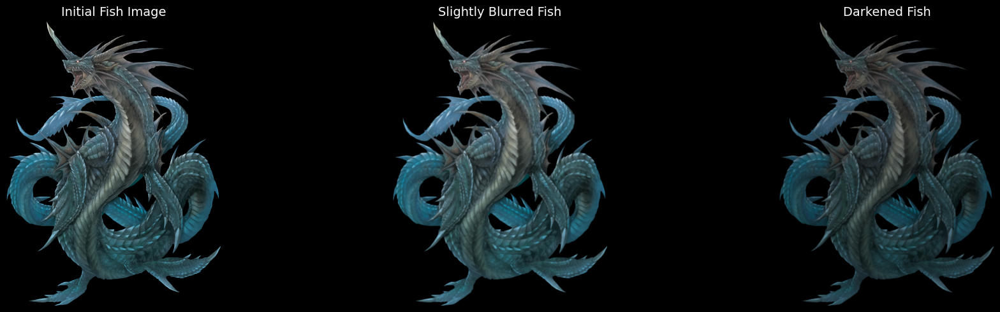

In [13]:
fish = open_image("../Pic/fish.png")
fish_resized = scale_image(fish, 2.2)
fish_blurred = blur_image(fish_resized, radius=2)
fish_darkened = adjust_brightness(fish_blurred, 0.7)

images = [fish, fish_blurred, fish_darkened]
captions = ["Initial Fish Image", "Slightly Blurred Fish", "Darkened Fish"]

fig, axes = plt.subplots(1, len(images), figsize=(20, 5), facecolor="black")

for ax, img, caption in zip(axes, images, captions):
    ax.imshow(img)
    ax.set_title(caption, fontsize=14, color="white")
    ax.axis("off")

plt.tight_layout()
plt.show()

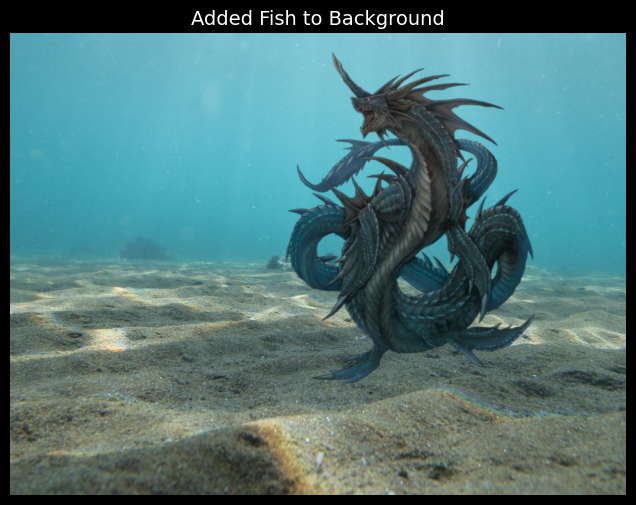

In [14]:
paste_with_rotation(background, fish_darkened, 0.65, 0.4, 0)
background.save("../Processed Pic/Pisa/result1.png")

plt.figure(figsize=(8, 6), facecolor="black")
plt.imshow(background)
plt.title("Added Fish to Background", fontsize=14, color="white")
plt.axis("off")
plt.show()

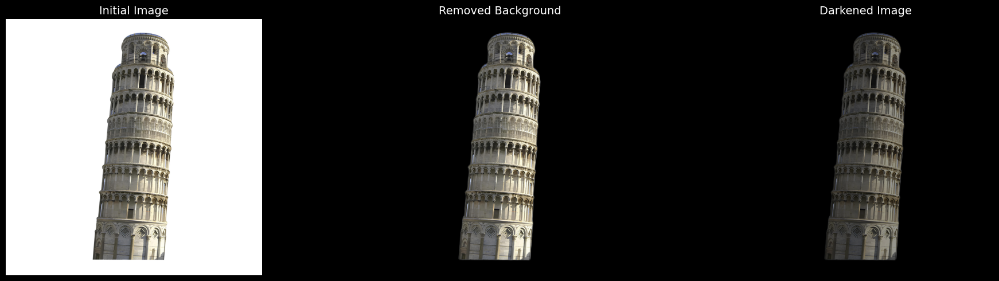

In [15]:
pisa = open_image("../Pic/pisa_cutout.jpg")
pisa_resized = scale_image(pisa, 1.2)
pisa_transparent = remove_background(pisa_resized)
pisa_darkened = adjust_brightness(pisa_transparent, 0.6)

images = [pisa, pisa_transparent, pisa_darkened]
captions = ["Initial Image", "Removed Background", "Darkened Image"]

fig, axes = plt.subplots(1, len(images), figsize=(20, 5), facecolor="black")

for ax, img, caption in zip(axes, images, captions):
    ax.imshow(img)
    ax.set_title(caption, fontsize=14, color="white")
    ax.axis("off")

plt.tight_layout()
plt.show()

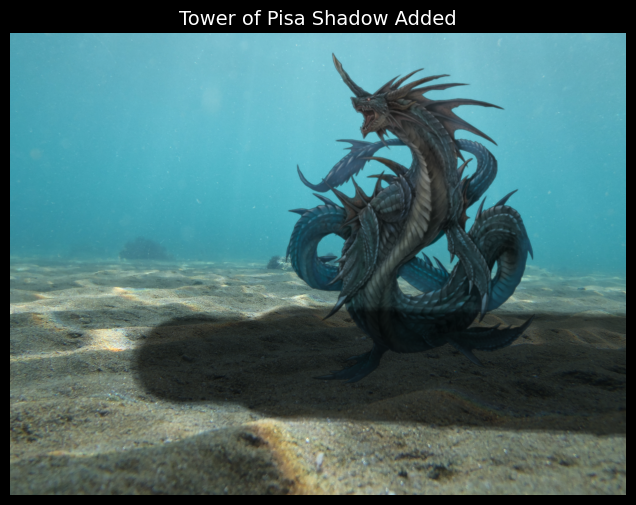

In [16]:
pisa_shadow = create_shadow(pisa_darkened, blur_radius=10, opacity=0.5, squash_factor=0.5, squash_axis="x")
paste_with_rotation(background, pisa_shadow, 0.85, 0.75, 90)
background.save("../Processed Pic/Pisa/result2.png")

plt.figure(figsize=(8, 6), facecolor="black")
plt.imshow(background)
plt.title("Tower of Pisa Shadow Added", fontsize=14, color="white")
plt.axis("off")
plt.show()

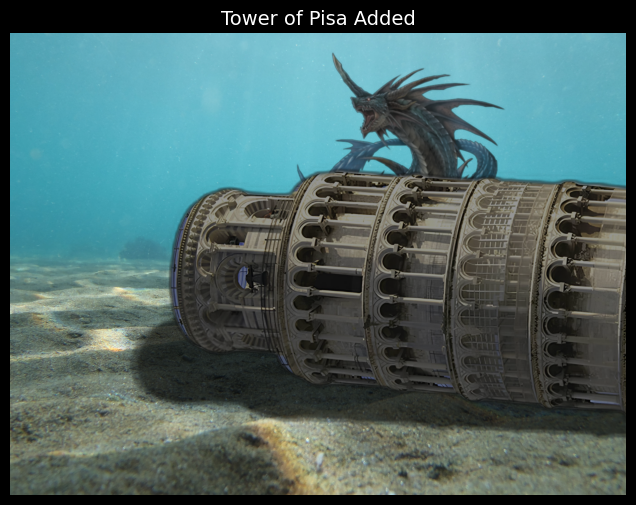

In [17]:
paste_with_rotation(background, pisa_darkened, 0.9, 0.6, 90)
background.save("../Processed Pic/Pisa/result3.png")

plt.figure(figsize=(8, 6), facecolor="black")
plt.imshow(background)
plt.title("Tower of Pisa Added", fontsize=14, color="white")
plt.axis("off")
plt.show()

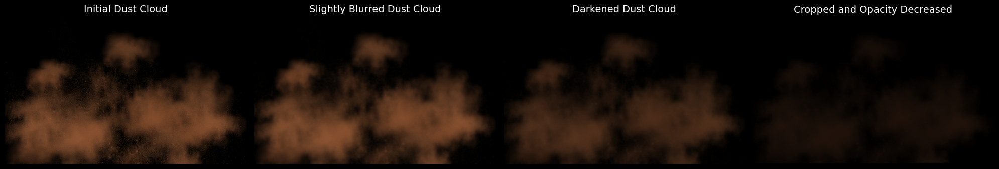

In [18]:
dust_cloud = open_image("../Pic/dust_cloud.png")
dust_cloud_blurred = blur_image(dust_cloud, radius=2)
dust_cloud_darkened = adjust_brightness(dust_cloud_blurred, 0.6)
dust_cloud_adjusted = crop_and_adjust_opacity(dust_cloud_darkened, 0.4)

images = [dust_cloud, dust_cloud_blurred, dust_cloud_darkened, dust_cloud_adjusted]
captions = ["Initial Dust Cloud", "Slightly Blurred Dust Cloud", "Darkened Dust Cloud", "Cropped and Opacity Decreased"]

fig, axes = plt.subplots(1, len(images), figsize=(20, 5), facecolor="black")

for ax, img, caption in zip(axes, images, captions):
    ax.imshow(img)
    ax.set_title(caption, fontsize=14, color="white")
    ax.axis("off")

plt.tight_layout()
plt.show()

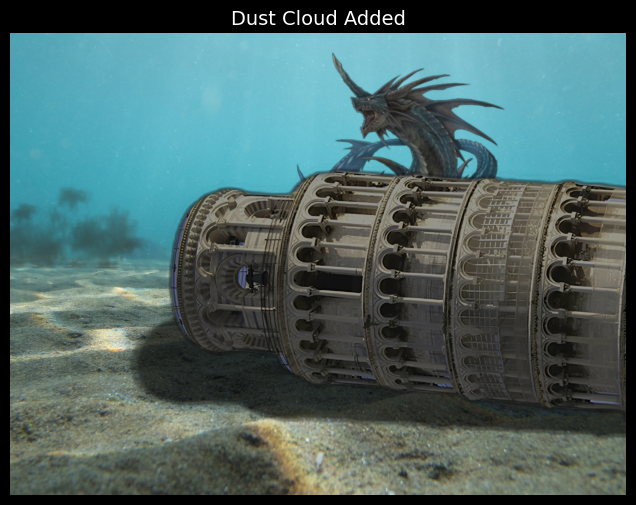

In [19]:
paste_with_rotation(background, dust_cloud_adjusted, 0.1, 0.41, 0)
background.save("../Processed Pic/Pisa/result4.png")

plt.figure(figsize=(8, 6), facecolor="black")
plt.imshow(background)
plt.title("Dust Cloud Added", fontsize=14, color="white")
plt.axis("off")
plt.show()

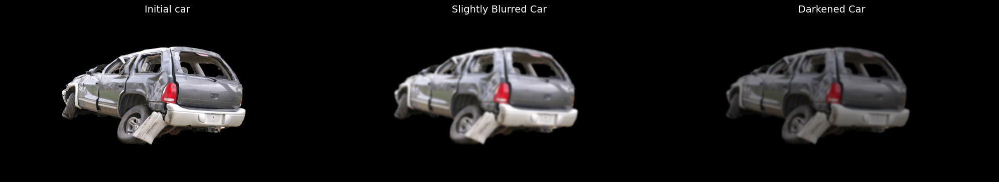

In [20]:
wrecked_car = open_image("../Pic/wrecked_car.png")
wrecked_car_resized = scale_image(wrecked_car, 0.4)
wrecked_car_blurred = blur_image(wrecked_car_resized , radius = 1.5)
wrecked_car_darkened = adjust_brightness(wrecked_car_blurred , 0.55)

images = [wrecked_car, wrecked_car_blurred, wrecked_car_darkened]
captions = ["Initial car", "Slightly Blurred Car", "Darkened Car"]

fig, axes = plt.subplots(1, len(images), figsize=(20, 5), facecolor="black")

for ax, img, caption in zip(axes, images, captions):
    ax.imshow(img)
    ax.set_title(caption, fontsize=14, color="white")
    ax.axis("off")

plt.tight_layout()
plt.show()

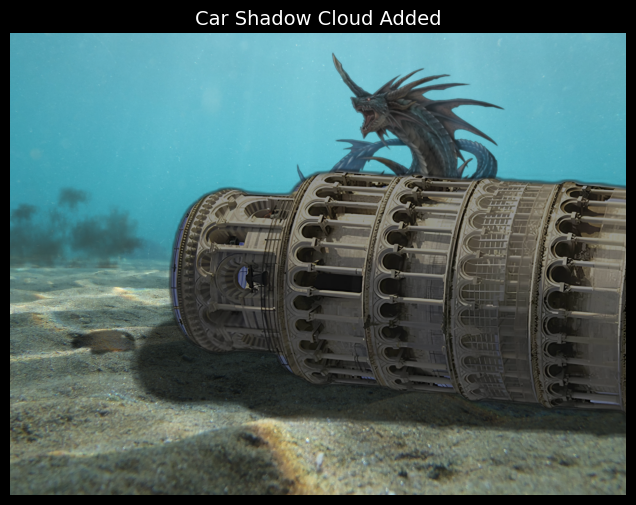

In [21]:
wrecked_car_shadow = create_shadow(wrecked_car_darkened, blur_radius=6, opacity=0.5, squash_factor=0.7, squash_axis="y")
paste_with_rotation(background, wrecked_car_shadow, 0.16, 0.67, 0)
background.save("../Processed Pic/Pisa/result5.png")

plt.figure(figsize=(8, 6), facecolor="black")
plt.imshow(background)
plt.title("Car Shadow Cloud Added", fontsize=14, color="white")
plt.axis("off")
plt.show()

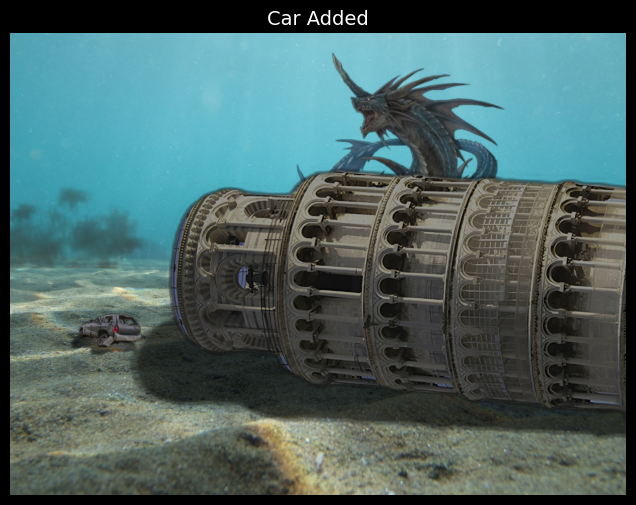

In [22]:
paste_with_rotation(background, wrecked_car_darkened, 0.17, 0.645 , 0)
background.save("../Processed Pic/Pisa/result6.png")

plt.figure(figsize=(8, 6), facecolor="black")
plt.imshow(background)
plt.title("Car Added", fontsize=14, color="white")
plt.axis("off")
plt.show()

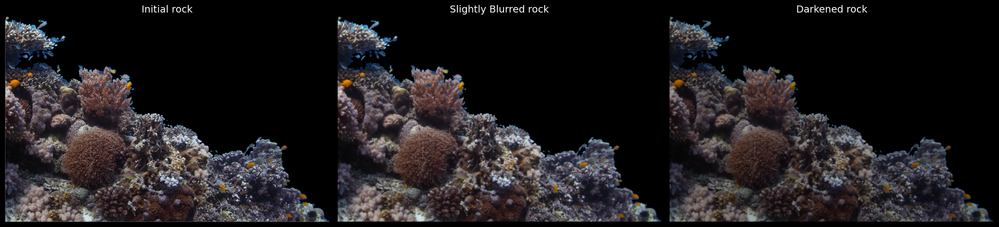

In [23]:
rock_cluster = open_image("../Pic/rock_cluster.png")
rock_cluster_resized = scale_image(rock_cluster, 1.7)
rock_cluster_blurred = blur_image(rock_cluster_resized, radius=2)
rock_cluster_darkened = adjust_brightness(rock_cluster_blurred, 0.75)

images = [rock_cluster, rock_cluster_blurred, rock_cluster_darkened]
captions = ["Initial rock", "Slightly Blurred rock", "Darkened rock"]

fig, axes = plt.subplots(1, len(images), figsize=(20, 5), facecolor="black")

for ax, img, caption in zip(axes, images, captions):
    ax.imshow(img)
    ax.set_title(caption, fontsize=14, color="white")
    ax.axis("off")

plt.tight_layout()
plt.show()

In [24]:
paste_with_rotation(background, rock_cluster_darkened, 0.3, 0.85 , 0)
background.save("../Processed Pic/Pisa/result7.png")

plt.figure(figsize=(8, 6), facecolor="black")
plt.imshow(background)
plt.title("Rock Added", fontsize=14, color="white")
plt.axis("off")
plt.show()

In [ ]:
godray = Image.open("../Pic/godray.jpg")
godray_flipped = godray.transpose(Image.FLIP_LEFT_RIGHT)
godray_transparent = godray_flipped.copy()
godray_transparent.putalpha(100)

images = [godray, godray_flipped, godray_transparent]
captions = ["Godray Overlay", "Flipped Godray Overlay", "Opacity Adjusted"]

fig, axes = plt.subplots(1, len(images), figsize=(20, 5), facecolor="black")

for ax, img, caption in zip(axes, images, captions):
    ax.imshow(img)
    ax.set_title(caption, fontsize=14, color="white")
    ax.axis("off")

plt.tight_layout()
plt.show()

In [ ]:
background.paste(godray_transparent, (0, 0), godray_transparent)
background.save("../Processed Pic/Pisa/result8.png")

plt.figure(figsize=(8, 6), facecolor="black")
plt.imshow(background)
plt.title("Overlay Added", fontsize=14, color="white")
plt.axis("off")
plt.show()

In [ ]:
contrast_enhancer = ImageEnhance.Contrast(background)
background = contrast_enhancer.enhance(1.4)
background.save("../Processed Pic/Pisa/result9.png")

plt.figure(figsize=(8, 6), facecolor="black")
plt.imshow(background)
plt.title("Contrast Increased", fontsize=14, color="white")
plt.axis("off")
plt.show()

In [ ]:
sharpness_enhancer = ImageEnhance.Sharpness(background)
background = sharpness_enhancer.enhance(1.5)
background.save("../Processed Pic/Pisa/result10.png")

plt.figure(figsize=(8, 6), facecolor="black")
plt.imshow(background)
plt.title("Sharpness Increased", fontsize=14, color="white")
plt.axis("off")
plt.show()

In [ ]:
color_enhancer = ImageEnhance.Color(background)
background = color_enhancer.enhance(1.3)
background.save("../Processed Pic/Pisa/result11.png")

plt.figure(figsize=(8, 6), facecolor="black")
plt.imshow(background)
plt.title("Saturation Increased", fontsize=14, color="white")
plt.axis("off")
plt.show()

In [ ]:
background = add_vignette(background, strength=0.9)
background.save("../Processed Pic/Pisa/result12.png")

plt.figure(figsize=(8, 6), facecolor="black")
plt.imshow(background)
plt.title("Added Vignette", fontsize=14, color="white")
plt.axis("off")
plt.show()

In [ ]:
results_dir = "../Processed Pic/Pisa"
file_pattern = "result{}.png"

background_image_path = "../Pic/background.jpg"
background_image = Image.open(background_image_path)

images = [background_image]
for i in range(1, 13):
    file_path = os.path.join(results_dir, file_pattern.format(i))
    image = Image.open(file_path)
    images.append(image)

fig, axes = plt.subplots(3, 5, figsize=(20, 12), facecolor="black")

axes = axes.flatten()

for ax, img, i in zip(axes, images, range(1, 14)):
    ax.imshow(img)
    if i == 1:
        ax.set_title("Initial Image", fontsize=14, color="white")
    else:
        ax.set_title(f"Result {i-1}", fontsize=14, color="white")
    ax.axis("off")

for j in range(len(images), len(axes)):
    axes[j].axis("off")

plt.tight_layout()
plt.show()

In [ ]:
combined_animation_frames = create_pisa_animation(background, fps=24, num_frames=144)

In [ ]:
for index, image in enumerate(tqdm(combined_animation_frames, desc="Saving images", unit = "image")):
    filename = f"../MP4 Frames/{index:04}.png"
    image.save(filename, "PNG")

In [ ]:
images_to_video("../MP4 Frames", "../Processed Pic/Pisa/pisa.mp4", fps=24)

In [3]:
add_audio_to_video("../Processed Pic/Pisa/pisa_with_audio.mp4", "../Pic/roar.mp3", "../Processed Pic/Pisa/pisa_with_roar.mp4", 
                    fade_duration=8, audio_start_frac=0, audio_end_frac=0.75)

Moviepy - Building video ../Processed Pic/Pisa/pisa_with_roar.mp4.
MoviePy - Writing audio in pisa_with_roarTEMP_MPY_wvf_snd.mp4


MoviePy - Done.
Moviepy - Writing video ../Processed Pic/Pisa/pisa_with_roar.mp4



Moviepy - Done !
Moviepy - video ready ../Processed Pic/Pisa/pisa_with_roar.mp4


Third Image (TBD)

In [17]:
PROTOTXT = "C:/Users/Hew/Desktop/ISE Assignment/model/colorization_deploy_v2.prototxt"
POINTS = "C:/Users/Hew/Desktop/ISE Assignment/model/pts_in_hull.npy"
MODEL = "C:/Users/Hew/Desktop/ISE Assignment/model/colorization_release_v2.caffemodel"

# Load the Model
print("Load model")
net = cv2.dnn.readNetFromCaffe(PROTOTXT, MODEL)
pts = np.load(POINTS)

# Load centers for ab channel quantization used for rebalancing.
class8 = net.getLayerId("class8_ab")
conv8 = net.getLayerId("conv8_313_rh")
pts = pts.transpose().reshape(2, 313, 1, 1)
net.getLayer(class8).blobs = [pts.astype("float32")]
net.getLayer(conv8).blobs = [np.full([1, 313], 2.606, dtype="float32")]

# Load the input image
image = cv2.imread("C:/Users/Hew/Desktop/ISE Assignment/Pic/colloseum.jpg")
scaled = image.astype("float32") / 255.0
lab = cv2.cvtColor(scaled, cv2.COLOR_BGR2LAB)

resized = cv2.resize(lab, (224, 224))
L = cv2.split(resized)[0]
L -= 50

print("Colorizing the image")
net.setInput(cv2.dnn.blobFromImage(L))
ab = net.forward()[0, :, :, :].transpose((1, 2, 0))

ab = cv2.resize(ab, (image.shape[1], image.shape[0]))

L = cv2.split(lab)[0]
colorized = np.concatenate((L[:, :, np.newaxis], ab), axis=2)

colorized = cv2.cvtColor(colorized, cv2.COLOR_LAB2BGR)
colorized = np.clip(colorized, 0, 1)

colorized = (255 * colorized).astype("uint8")

cv2.imwrite("C:/Users/Hew/Desktop?ISE Assignment/Processed Pic/Colosseum/colorized.jpg", colorized)

Load model
Colorizing the image


False

In [2]:
sr = dnn_superres.DnnSuperResImpl_create()

sr.readModel("../model/EDSR_x4.pb")

sr.setModel("edsr", 4)

image = cv2.imread('../Processed Pic/Colosseum/colorized.jpg')

upscaled = sr.upsample(image)
cv2.imwrite('../Processed Pic/Colosseum/upscaled.png', upscaled)

True

In [18]:
lab_upscaled = cv2.cvtColor(upscaled, cv2.COLOR_BGR2LAB)
l_channel, a_channel, b_channel = cv2.split(lab_upscaled)

clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
cl_l_channel = clahe.apply(l_channel)

merged_lab = cv2.merge((cl_l_channel, a_channel, b_channel))
equalized_color_upscaled = cv2.cvtColor(merged_lab, cv2.COLOR_LAB2BGR)

cv2.imwrite('../Processed Pic/Colosseum/equalized.png', equalized_color_upscaled)